In [11]:
import matplotlib.pyplot as plt
import numpy as np
from Q_Learning import evaluate, train, make_QTables
from extended_pd import parallel_env

In [12]:
env = parallel_env()

# Values of gamma to test
gamma_values = [0.8, 0.9, 0.95, 0.99]

# Lists to store results for each gamma
mean_rewards_list = []

In [13]:
trials = 5

tot_rew = []

for t in range(trials):

    tot_rew_per_episode = []

    for gamma in gamma_values:
        alfa = 0.01
        adecay = 0.0001
        env = parallel_env()
        observations, infos = env.reset()
        qtables = make_QTables(env, gamma)
        qtables,tot_rew_per_gamma = train(env, 40000, 0, 0.2, 0.000006, 100, qtables, gamma, alfa, adecay)
        tot_rew_per_episode.append(tot_rew_per_gamma)
    
    tot_rew.append(tot_rew_per_episode)

In [14]:
print(tot_rew)

[[[0.3044444444444443, 0.322222222222222, 0.35777777777777775, 0.34444444444444455, 0.3033333333333333, 0.38777777777777783, 0.29888888888888876, 0.3099999999999999, 0.30111111111111105, 0.32111111111111107, 0.32999999999999985, 0.3477777777777777, 0.26333333333333325, 0.34222222222222215, 0.36777777777777776, 0.3388888888888888, 0.3466666666666666, 0.33222222222222214, 0.36333333333333334, 0.341111111111111, 0.3299999999999999, 0.30888888888888877, 0.3099999999999999, 0.2933333333333334, 0.3644444444444444, 0.3388888888888888, 0.32555555555555543, 0.31555555555555553, 0.33333333333333326, 0.30111111111111105, 0.33888888888888874, 0.36333333333333345, 0.28222222222222215, 0.31666666666666643, 0.3266666666666666, 0.3222222222222222, 0.3133333333333332, 0.3544444444444444, 0.36333333333333323, 0.34, 0.3299999999999999, 0.3222222222222222, 0.302222222222222, 0.3655555555555554, 0.26999999999999985, 0.2655555555555555, 0.2855555555555555, 0.29555555555555546, 0.29444444444444434, 0.2988888

In [15]:
my_array = np.array(tot_rew)

my_array.shape

(5, 4, 40000)

In [16]:
average_payoffs = np.mean(my_array, axis=0)

average_payoffs.shape

(4, 40000)

In [17]:
average_payoffs

array([[0.31533333, 0.37466667, 0.38355556, ..., 0.61422222, 0.612     ,
        0.61066667],
       [0.24466667, 0.28888889, 0.30466667, ..., 0.50155556, 0.50066667,
        0.50044444],
       [0.25888889, 0.23577778, 0.26466667, ..., 0.39111111, 0.39466667,
        0.39266667],
       [0.21866667, 0.23377778, 0.22711111, ..., 0.33955556, 0.34066667,
        0.34222222]])

In [18]:
average_payoffs = np.transpose(average_payoffs)

average_payoffs.shape

(40000, 4)

In [19]:
average_payoffs

array([[0.31533333, 0.24466667, 0.25888889, 0.21866667],
       [0.37466667, 0.28888889, 0.23577778, 0.23377778],
       [0.38355556, 0.30466667, 0.26466667, 0.22711111],
       ...,
       [0.61422222, 0.50155556, 0.39111111, 0.33955556],
       [0.612     , 0.50066667, 0.39466667, 0.34066667],
       [0.61066667, 0.50044444, 0.39266667, 0.34222222]])

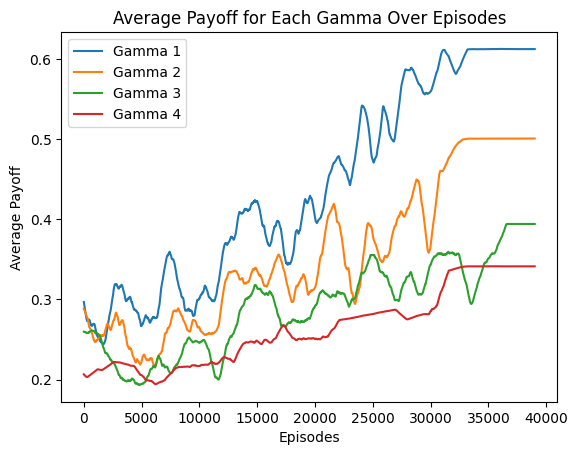

In [20]:
# Calculate the average payoff for each gamma
average_payoffs = np.mean(my_array, axis=0)

# Transpose the array for plotting
average_payoffs = np.transpose(average_payoffs)

# Set the window size for smoothing the plot
window_size = 1000

# Create a plot
fig, ax = plt.subplots()

# Plot each line for different gammas with smoothing
for i in range(average_payoffs.shape[1]):
    smoothed_values = np.convolve(average_payoffs[:, i], np.ones(window_size)/window_size, mode='valid')
    ax.plot(smoothed_values, label=f'Gamma {i+1}')

# Set labels and title
ax.set_xlabel('Episodes')
ax.set_ylabel('Average Payoff')
ax.set_title('Average Payoff for Each Gamma Over Episodes')

# Add legend
ax.legend()

# Show the plot
plt.show()